In [15]:
import os
import json
import pickle
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from PIL import Image
from generate_im_labels import load_labels_and_label_file, get_labels

In [2]:
ROOT_DIR = 'mapillary/'
TRAIN_IMAGES_DIR = os.path.join(ROOT_DIR, 'training', 'images')
TRAIN_LABELS_DIR = os.path.join(ROOT_DIR, 'training', 'labels')
VAL_IMAGES_DIR = os.path.join(ROOT_DIR, 'validation', 'images')
VAL_LABELS_DIR = os.path.join(ROOT_DIR, 'validation', 'labels')

### Explore the Dataset

In [3]:
ROOT_DIR = 'mapillary/'
with open(os.path.join(ROOT_DIR, 'config.json')) as config_file:
        config = json.load(config_file)

In [4]:
all_labels = config['labels']
all_labels

[{'color': [165, 42, 42],
  'instances': True,
  'readable': 'Bird',
  'name': 'animal--bird',
  'evaluate': True},
 {'color': [0, 192, 0],
  'instances': True,
  'readable': 'Ground Animal',
  'name': 'animal--ground-animal',
  'evaluate': True},
 {'color': [196, 196, 196],
  'instances': False,
  'readable': 'Curb',
  'name': 'construction--barrier--curb',
  'evaluate': True},
 {'color': [190, 153, 153],
  'instances': False,
  'readable': 'Fence',
  'name': 'construction--barrier--fence',
  'evaluate': True},
 {'color': [180, 165, 180],
  'instances': False,
  'readable': 'Guard Rail',
  'name': 'construction--barrier--guard-rail',
  'evaluate': True},
 {'color': [90, 120, 150],
  'instances': False,
  'readable': 'Barrier',
  'name': 'construction--barrier--other-barrier',
  'evaluate': True},
 {'color': [102, 102, 156],
  'instances': False,
  'readable': 'Wall',
  'name': 'construction--barrier--wall',
  'evaluate': True},
 {'color': [128, 64, 255],
  'instances': False,
  'reada

In [7]:
print('There are {} labels in the config file'.format(len(all_labels)))

There are 66 labels in the config file


In [ ]:
sample_im = 'M2kh294N9c72sICO990Uew'

In [ ]:
image_template_path = os.path.join(ROOT_DIR, 'training/images/{}.jpg')
label_template_path = os.path.join(ROOT_DIR, 'training/labels/{}.png')
instance_template_path = os.path.join(ROOT_DIR, 'training/instances/{}.png')
panoptic_template_path = os.path.join(ROOT_DIR, 'training/panoptic/{}.png')

In [ ]:
base_image = Image.open(image_template_path.format(sample_im))
base_image

In [ ]:
label_image = Image.open(label_template_path.format(sample_im))
label_image

In [ ]:
instance_image = Image.open(instance_template_path.format(sample_im))
instance_image

In [ ]:
label_array = np.array(label_image)
instance_array = np.array(instance_image, dtype=np.uint16)

In [ ]:
instance_array

In [ ]:
instance_label_array = np.array(instance_array / 256, dtype=np.uint8)
# seems like you can only have 256 of each object.
instance_ids_array = np.array(instance_array % 256, dtype=np.uint8)

In [ ]:
instance_label_array

In [13]:
def apply_color_map(image_array, labels):
    color_array = np.zeros((image_array.shape[0], image_array.shape[1], 3), dtype=np.uint8)

    for label_id, label in enumerate(labels):
        # set all pixels with the current label to the color of the current label
        if label['readable'] == 'Person':
            print(np.sum(image_array == label_id))
        color_array[image_array == label_id] = label["color"]

    return color_array

def get_visualizable_label(f_path, all_labels):
    im = Image.open(f_path)
    im = np.array(im)
    return apply_color_map(im, all_labels)

In [ ]:
colored_label_array = apply_color_map(label_array, labels)

In [ ]:
fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(20,15))
ax[0][0].imshow(base_image)
ax[0][0].get_xaxis().set_visible(False)
ax[0][0].get_yaxis().set_visible(False)
ax[0][0].set_title("Base image")
ax[0][0].set_title("Base image")
ax[0][1].imshow(colored_label_array)
ax[0][1].get_xaxis().set_visible(False)
ax[0][1].get_yaxis().set_visible(False)

### Define the task: Construction

In [29]:
labels, label_to_file = load_labels_and_label_file('val')

In [30]:
print(len(labels))
print(len(label_to_file))

2000
66


In [37]:
# filter by a high level category
categories = []
selected_files = set()
not_selected_files = set()
FILTER_CATEGORY = 'human--person'
for label in label_to_file.keys():
    categories.append((label, len(label_to_file[label])/len(labels)))
    if FILTER_CATEGORY in label:
        for f in label_to_file[label]:
            selected_files.add(f)
    else:
        not_selected_files.add(label_to_file[label][0])
# print('Construction is visible in {} percent of the total dataset'.format(len(selected_files)/len(labels)))
positive_person_examples = list(selected_files)[20:30]
negative_person_examples = list(not_selected_files)[:10]
for im in positive_person_examples:
    print(labels[im])
sorted_list = sorted(categories, key=lambda x: x[1])
# for x in sorted_list:
#     print(x)

[('Curb', 'construction--barrier--curb', False), ('Fence', 'construction--barrier--fence', False), ('Wall', 'construction--barrier--wall', False), ('Curb Cut', 'construction--flat--curb-cut', False), ('Road', 'construction--flat--road', False), ('Sidewalk', 'construction--flat--sidewalk', False), ('Building', 'construction--structure--building', False), ('Person', 'human--person', True), ('Lane Marking - Crosswalk', 'marking--crosswalk-zebra', True), ('Lane Marking - General', 'marking--general', False), ('Sky', 'nature--sky', False), ('Terrain', 'nature--terrain', False), ('Vegetation', 'nature--vegetation', False), ('Billboard', 'object--billboard', True), ('Street Light', 'object--street-light', True), ('Pole', 'object--support--pole', True), ('Utility Pole', 'object--support--utility-pole', True), ('Trash Can', 'object--trash-can', True), ('Car', 'object--vehicle--car', True), ('Ego Vehicle', 'void--ego-vehicle', False), ('Unlabeled', 'void--unlabeled', False)]
[('Curb', 'construct

In [32]:
for x in positive_person_examples:
    f_path = VAL_LABELS_DIR + '/' + x.split('.')[0] + '.png'
    im = Image.open(f_path)
    im = np.array(im)
    print(sorted(get_labels(im, all_labels)))
    print(x)
    print(sorted(labels[x]))

[('Barrier', 'construction--barrier--other-barrier', False), ('Billboard', 'object--billboard', True), ('Bridge', 'construction--structure--bridge', False), ('Building', 'construction--structure--building', False), ('Bus', 'object--vehicle--bus', True), ('Car', 'object--vehicle--car', True), ('Car Mount', 'void--car-mount', False), ('Curb', 'construction--barrier--curb', False), ('Ego Vehicle', 'void--ego-vehicle', False), ('Fence', 'construction--barrier--fence', False), ('Guard Rail', 'construction--barrier--guard-rail', False), ('Lane Marking - General', 'marking--general', False), ('Person', 'human--person', True), ('Pole', 'object--support--pole', True), ('Road', 'construction--flat--road', False), ('Sidewalk', 'construction--flat--sidewalk', False), ('Sky', 'nature--sky', False), ('Snow', 'nature--snow', False), ('Street Light', 'object--street-light', True), ('Terrain', 'nature--terrain', False), ('Traffic Sign (Back)', 'object--traffic-sign--back', True), ('Traffic Sign (Front)

[('Barrier', 'construction--barrier--other-barrier', False), ('Bridge', 'construction--structure--bridge', False), ('Curb', 'construction--barrier--curb', False), ('Ego Vehicle', 'void--ego-vehicle', False), ('Fence', 'construction--barrier--fence', False), ('Lane Marking - General', 'marking--general', False), ('Person', 'human--person', True), ('Pole', 'object--support--pole', True), ('Road', 'construction--flat--road', False), ('Sky', 'nature--sky', False), ('Traffic Sign (Front)', 'object--traffic-sign--front', True), ('Vegetation', 'nature--vegetation', False), ('Wall', 'construction--barrier--wall', False)]
E1fW9YQ1i6wFQS1MFkH1dg.jpg
[('Barrier', 'construction--barrier--other-barrier', False), ('Bridge', 'construction--structure--bridge', False), ('Curb', 'construction--barrier--curb', False), ('Ego Vehicle', 'void--ego-vehicle', False), ('Fence', 'construction--barrier--fence', False), ('Lane Marking - General', 'marking--general', False), ('Person', 'human--person', True), ('Po

[('Building', 'construction--structure--building', False), ('Curb', 'construction--barrier--curb', False), ('Ego Vehicle', 'void--ego-vehicle', False), ('Junction Box', 'object--junction-box', True), ('Lane Marking - General', 'marking--general', False), ('Person', 'human--person', True), ('Pole', 'object--support--pole', True), ('Road', 'construction--flat--road', False), ('Service Lane', 'construction--flat--service-lane', False), ('Sky', 'nature--sky', False), ('Street Light', 'object--street-light', True), ('Traffic Sign (Back)', 'object--traffic-sign--back', True), ('Traffic Sign (Front)', 'object--traffic-sign--front', True), ('Unlabeled', 'void--unlabeled', False), ('Utility Pole', 'object--support--utility-pole', True), ('Vegetation', 'nature--vegetation', False)]
fmHX0NYkLPe2ZMvNY1s_GQ.jpg
[('Building', 'construction--structure--building', False), ('Curb', 'construction--barrier--curb', False), ('Ego Vehicle', 'void--ego-vehicle', False), ('Junction Box', 'object--junction-box

1875
3795
1362
675
12338
209294
60
294
155211
823


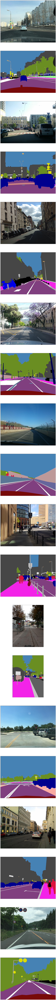

In [36]:
fig, ax = plt.subplots(nrows=len(positive_person_examples)*2, ncols=1, figsize=(400,300))
i = 0
for x in positive_person_examples:
    ax[i].imshow(Image.open(VAL_IMAGES_DIR + '/' + x))
    ax[i].get_xaxis().set_visible(False)
    ax[i].get_yaxis().set_visible(False)
    f_path = VAL_LABELS_DIR + '/' + x.split('.')[0] + '.png'
    ax[i+1].imshow(get_visualizable_label(f_path, all_labels))
    ax[i+1].get_xaxis().set_visible(False)
    ax[i+1].get_yaxis().set_visible(False)
    i += 2

In [ ]:
VAL_LABELS_DIR = os.path.join(ROOT_DIR, 'validation', 'labels')
example_val_im = Image.open(TRAIN_IMAGES_DIR + '/R0kayPLS1ZnpUUQ4RrWYoQ.png')

In [ ]:
labels_im = np.array(example_val_im)
get_labels(labels_im, labels)
print(val_labels[''])

### Save the labels

In [ ]:
# Generating train labels takes around an hour, so save the labels in advance.
with open('train_labels.pickle', 'wb') as handle:
    pickle.dump(train_labels, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
with open('val_labels.pickle', 'wb') as handle:
    pickle.dump(val_labels, handle, protocol=pickle.HIGHEST_PROTOCOL)